In [1]:
# cleaning data
import pandas as pd
import numpy as np
import datetime


df = pd.read_csv('data.csv')

def removeUnwantedItems(df):
    df.drop(columns = ['new_price','seller_type'],axis = 1,inplace = True)
    df.dropna(inplace = True)

def cleanSeatsColumn(df):
    seats = []

    for item in df['seats']:
        seats += [int(item[-1:])]
    df['seats'] = seats



def cleanKmDrivenColumn(df):
    km_driven = []
    for item in df['km_driven']:
        temp = item[:-4]
        temp = temp.replace(',','')
        km_driven += [int(temp)]

    df['km_driven'] = km_driven


def cleanMaxPowerColumn(df):
    max_power = []
    for item in df['max_power']:
        max_power += [float(item[9:-4])] 
    df['max_power'] = max_power

def cleanEngineColumn(df):
    engine = []
    for item in df['engine']:
        engine += [int(item[6:-3])]

    df['engine'] = engine

def cleanMileageColumn(df):
    mileage = []
    for item in df['mileage']:
        mileage += [float(item[7:-5])]

    df['mileage'] = mileage

def cleanSellingPriceColumn(df):
    selling_price = []
    for item in df['selling_price']:
        selling_price += [float(item[:-6])]

    df['selling_price'] = selling_price


def addAgeColumn(df):
    age = []
    currentDateTime = datetime.datetime.now()
    date = currentDateTime.date()
    year = date.strftime("%Y")
    for item in df['year']:
        age += [int(year) - int(item)]
    
    df['age'] = age

    df.drop(columns = ['year'],axis = 1,inplace = True)

def seperateMaufacturerAndModel(df):
    df['full_name'] = df['full_name'].str.lower()
    new = df['full_name'].str.split(" ",1,expand = True)
    df['manufacturer'] = new[0]
    # df['model'] = new[1]
    # counts = df['manufacturer'].value_counts()
    # mask = df['manufacturer'].isin(counts[counts < 20].index)
    # df.loc[mask,'manufacturer'] = "other"

    df.drop(columns = ['full_name'],axis = 1,inplace = True)

def encodeData(df):
    df = pd.get_dummies(df,drop_first=True)
    return df

def cleanData(df):
    removeUnwantedItems(df)
    cleanSeatsColumn(df)
    cleanKmDrivenColumn(df)
    cleanMaxPowerColumn(df)
    cleanEngineColumn(df)
    cleanMileageColumn(df)
    cleanSellingPriceColumn(df)
    addAgeColumn(df)
    seperateMaufacturerAndModel(df)
    df = encodeData(df)
    return df

df = cleanData(df)
df.info()








<class 'pandas.core.frame.DataFrame'>
Int64Index: 19542 entries, 0 to 19973
Data columns (total 52 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   selling_price               19542 non-null  float64
 1   km_driven                   19542 non-null  int64  
 2   mileage                     19542 non-null  float64
 3   engine                      19542 non-null  int64  
 4   max_power                   19542 non-null  float64
 5   seats                       19542 non-null  int64  
 6   age                         19542 non-null  int64  
 7   fuel_type_Diesel            19542 non-null  uint8  
 8   fuel_type_Electric          19542 non-null  uint8  
 9   fuel_type_LPG               19542 non-null  uint8  
 10  fuel_type_Petrol            19542 non-null  uint8  
 11  transmission_type_Manual    19542 non-null  uint8  
 12  manufacturer_audi           19542 non-null  uint8  
 13  manufacturer_bentley        195

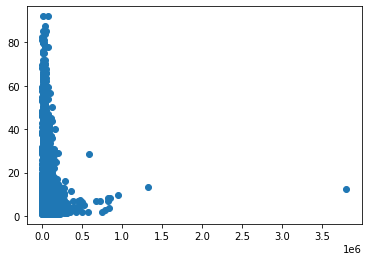

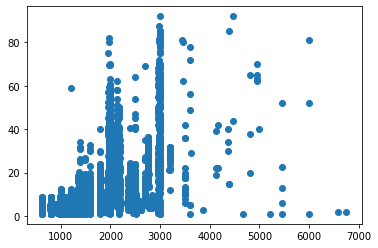

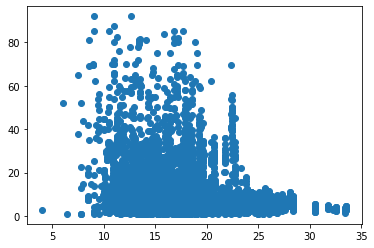

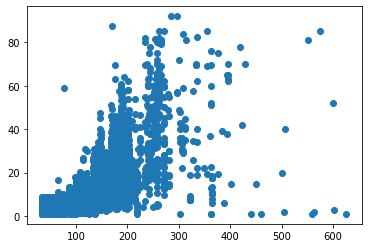

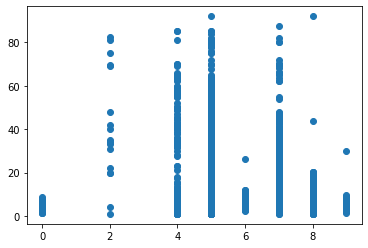

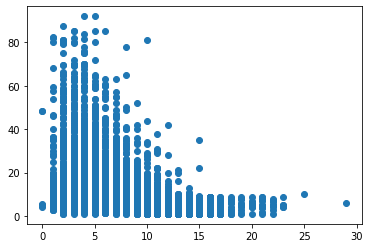

In [2]:
# visualizing data
import matplotlib.pyplot as plt
%matplotlib inline
plt.scatter(df['km_driven'],df['selling_price'])
plt.show()
plt.scatter(df['engine'],df['selling_price'])
plt.show()
plt.scatter(df['mileage'],df['selling_price'])
plt.show()
plt.scatter(df['max_power'],df['selling_price'])
plt.show()
plt.scatter(df['seats'],df['selling_price'])
plt.show()
plt.scatter(df['age'],df['selling_price'])
plt.show()




In [3]:
# splitting data

from sklearn.model_selection import train_test_split

X = df.drop(columns=['selling_price']).to_numpy()
y = df['selling_price'].to_numpy()
X_train, X_test, y_train, y_test = train_test_split(
         X, y, test_size=0.20, random_state=42) 


X_train_without_categorical_features = X_train[:,0:6]
X_test_without_categorical_features = X_test[:,0:6]
print(X_train_without_categorical_features.shape)

(15633, 6)


In [4]:
from sklearn import preprocessing

scaler = preprocessing.StandardScaler().fit(X_train_without_categorical_features)
print(X_train_without_categorical_features.shape)
print(scaler.mean_)
print(scaler.scale_)
X_train_scaled = scaler.transform(X_train_without_categorical_features)
X_test_scaled = scaler.transform(X_test_without_categorical_features)

X_train_merged = np.concatenate((X_train_without_categorical_features,X_train[:,6:]),axis = 1)
X_test_merged = np.concatenate((X_test_without_categorical_features,X_test[:,6:]),axis = 1)

print(X_train_merged.shape)

(15633, 6)
[5.74214305e+04 1.94883765e+01 1.47855300e+03 9.95809234e+01
 5.31132860e+00 6.38623425e+00]
[4.09551613e+04 4.06380133e+00 5.19089002e+02 4.39178927e+01
 8.36761848e-01 3.16209477e+00]
(15633, 51)


In [5]:
# training model
from sklearn import linear_model
from sklearn.metrics import mean_squared_error

reg = linear_model.LinearRegression()
reg.fit(X_train_merged,y_train)
y_train_pred = reg.predict(X_train_merged)
y_test_pred = reg.predict(X_test_merged)


17.69480402931863
20.280344301714567
0.7221760239395533
0.6910749243313306
0.698866492610547


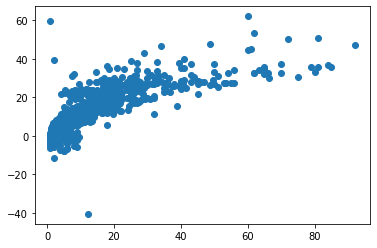

In [10]:
# model metrics evaluation
from sklearn.model_selection import cross_val_score
print(mean_squared_error(y_train, y_train_pred))
print(mean_squared_error(y_test, y_test_pred))

print(reg.score(X_train_merged,y_train))
print(reg.score(X_test_merged,y_test))
scores = cross_val_score(reg, X_train_merged, y_train, cv=5)
print(scores.mean())
plt.scatter(y_test,y_test_pred)

In [7]:
from sklearn.model_selection import learning_curve
train_sizes,train_scores, valid_scores = learning_curve(reg, X_train_merged, y_train, cv=5)
print(train_sizes)
train_scores_mean =  np.mean(train_scores,axis = 1)
valid_scores_mean =  np.mean(valid_scores,axis = 1)

[ 1250  4064  6878  9692 12506]


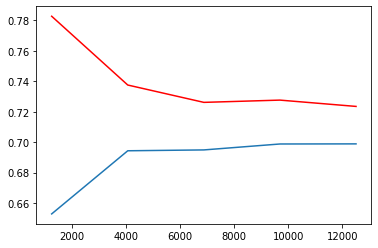

In [8]:
#learning curve
plt.plot(train_sizes,train_scores_mean,color = 'r')
plt.plot(train_sizes,valid_scores_mean)
plt.show()
# It look like model is suffering from high varaince(overfitting).Increasing training 
# example will be more helpful
